In [1]:
import numpy as np
import seaborn as sns
import scanpy as sc
import matplotlib.pyplot as plt
import time
import pandas as pd

In [27]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
import matplotlib.font_manager # to solve: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.

font_size = 10

# matplotlib.rcParams.keys()
rc={'font.size': font_size, 'axes.labelsize': font_size, 'figure.dpi':400,'axes.linewidth':1,
    'axes.titlesize': font_size, 'xtick.labelsize': font_size, 'ytick.labelsize': font_size} # 'figure.figsize':(11.7/1.5,8.27/1.5)

sns.set(style='ticks',rc=rc) 
sns.set_context("paper")
# sns.palplot(sns.color_palette(flatui))

mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

mpl.rcParams['font.sans-serif'] = "Arial"
mpl.rcParams['font.family'] = "sans-serif"
plt.rcParams['axes.unicode_minus']=False # negative minus sign
centimeter = 1/2.54  # centimeter in inches

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
# sc.settings.set_figure_params(dpi=400, dpi_save=400, figsize=(6,6), fontsize = 10, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.1 scipy==1.6.2 pandas==1.2.4 scikit-learn==1.1.2 statsmodels==0.12.2 python-igraph==0.9.11 pynndescent==0.5.7


In [29]:
sc_data_path = '/hwfssz1/ST_HEALTH/P20Z10200N0170/panzhikang/huaxi_v5/nc_sc_merge.h5ad'
adata = sc.read_h5ad(sc_data_path)

In [30]:
adata.obs['annotation'].value_counts()

T_cell         35410
NK             34827
Granulocyte    18502
AT2_like       11766
AT2             9063
B_cell          6853
Macrophage      6778
Endothelial     2731
Club            2420
Ciliated        2231
DC              2179
Fibroblast      1794
Erythrocyte     1061
MAST_cell        273
AT1              222
Basal             18
Name: annotation, dtype: int64

In [31]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 5909 genes that are detected in less than 3 cells


In [32]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [33]:
adata

AnnData object with n_obs × n_vars = 136128 × 27622
    obs: 'batch', 'batch2', 'cell_name', 'annotation', 'newbatch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids-0', 'feature_types-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

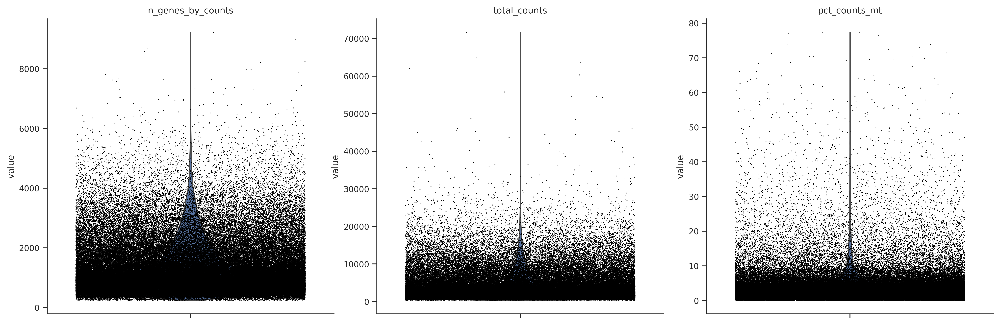

In [34]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [35]:
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [36]:
sc.pp.normalize_total(adata)#,target_sum=1e4)

/jdfssz1/ST_HEALTH/P18Z10200N0124/AI/user/baiyong/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [37]:
sc.pp.log1p(adata)

In [38]:
# gene_init=[x for x in adata.var_names if not '.' in x]
# adata = adata[:,gene_init]

In [39]:
sc.pp.highly_variable_genes(adata, n_top_genes=1500)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [40]:
adata

AnnData object with n_obs × n_vars = 103600 × 27622
    obs: 'batch', 'batch2', 'cell_name', 'annotation', 'newbatch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids-0', 'feature_types-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [41]:
gene_dict = {'DC': ['LYZ','HLA-DRB1','IL1B','LST1','HLA-DQA1','HLA-DQB1'],
            'Fibroblast':['LUM','DCN','FBLN1','APOD','COL1A1','IGFBP6','CFD'],
            'Macrophage':['CD68','MARCO','CTSD','C1QA','C1QB','APOC1','APOE'],
            'NK':['NKG7','GZMA','GNLY','CD3G','FGFBP2'],
            'T_cell':['CD2','CD3D','CD3E','CXCR4','IL32'],
             'B_cell':['MS4A1','FKBP11', 'DERL3','CD79A','MZB1','IGHA2'], # no 'IGLL5','IGJ' in data
            'Club':['SCGB1A1','SCGB3A1','PIGR','WFDC2'],
            'Ciliated':['CAPS','TPPP3','C9orf24'],
            'Endothelial':['RAMP2','VWF','GNG11'],
             'AT1':['RTKN2','EMP2'],
             'AT2':['PIGR', 'WFDC2','SFTA2','NAPSA','SFTPB','SFTPD','SFTPA1','SFTPC'],
             'AT2_like': ['MDK','TIMP1','IFI27','EPCAM','SCGB3A2'],
             'Basal':['KRT15','S100A2'], # no MIR205HG 
             'Erythrocyte':['HBA1','HBA2','HBB'],
             'Granulocyte':['G0S2','S100A8','S100A9'],
             'MAST_cell':['RGS13','HPGDS','CPA3','TPSAB1'],
            }

genes =[]
for x in list(gene_dict.values()):
    genes+=x


In [42]:
uni_genes = np.unique(adata.var_names[adata.var.highly_variable].tolist()+genes)

In [43]:
adata = adata[:, uni_genes]

In [44]:
adata

View of AnnData object with n_obs × n_vars = 103600 × 1517
    obs: 'batch', 'batch2', 'cell_name', 'annotation', 'newbatch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids-0', 'feature_types-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [45]:
sc.pp.scale(adata)

/jdfssz1/ST_HEALTH/P18Z10200N0124/AI/user/baiyong/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [46]:
sc.tl.pca(adata, svd_solver='arpack',n_comps=60)

computing PCA
    on highly variable genes
    with n_comps=60
    finished (0:00:07)


In [47]:
sc.pp.neighbors(adata, n_neighbors=8, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


In [66]:
sc.tl.umap(adata,min_dist=0.32)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:55)


In [50]:
# sc.tl.leiden(adata,resolution=0.15)

running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:34)


In [59]:
adata

AnnData object with n_obs × n_vars = 103600 × 1517
    obs: 'batch', 'batch2', 'cell_name', 'annotation', 'newbatch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids-0', 'feature_types-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'annotation_colors', 'dendrogram_annotation'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

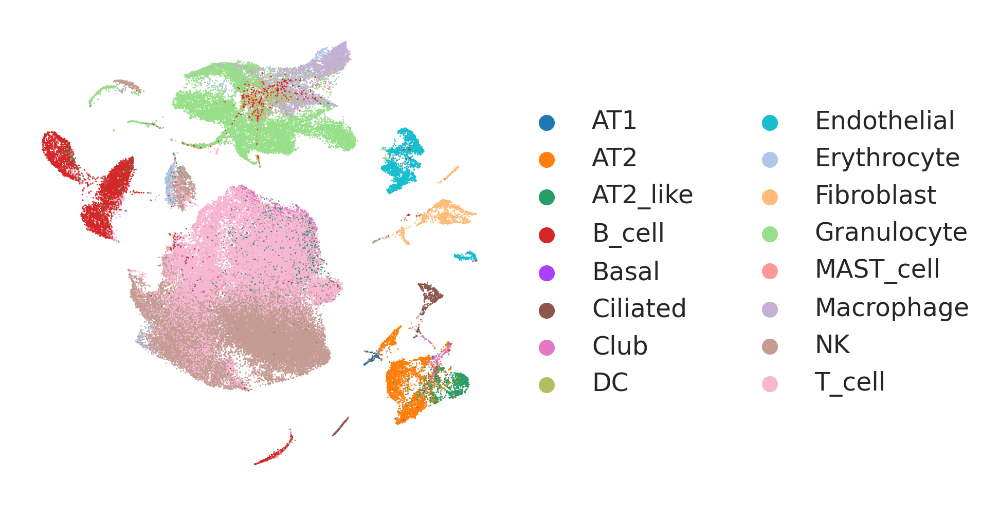

In [67]:
fig,ax=plt.subplots(figsize=(3,3))
sc.pl.umap(adata, color=['annotation'],frameon = False, show=False, ax=ax)
ax.set_title(None)

plt.savefig("results/sc_umap.pdf", dpi=400, bbox_inches='tight',format='pdf')

In [370]:
# original markers
# gene_dict = {'DC': ['LYZ','HLA-DRB1','IL1B','LST1','HLA-DQA1','HLA-DQB1'],
#             'Fibroblast':['LUM','DCN','FBLN1','APOD','COL1A1','IGFBP6','CFD'],
#             'Macrophage':['CD68','MARCO','CTSD','C1QA','C1QB','APOC1','APOE'],
#             'NK':['NKG7','GZMA','GNLY','CD3G','FGFBP2'],
#             'T_cell':['CD2','CD3D','CD3E','CXCR4','IL32'],
#              'B_cell':['MS4A1','FKBP11', 'DERL3','CD79A','MZB1','IGHA2'], # no 'IGLL5','IGJ' in data
#             'Club':['SCGB1A1','SCGB3A1','PIGR','WFDC2'],
#             'Ciliated':['CAPS','TPPP3','C9orf24'],
#             'Endothelial':['RAMP2','VWF','GNG11'],
#              'AT1':['RTKN2','EMP2'],
#              'AT2':['PIGR', 'WFDC2','SFTA2','NAPSA','SFTPB','SFTPD','SFTPA1','SFTPC'],
#              'AT2_like': ['MDK','TIMP1','IFI27','EPCAM','SCGB3A2'],
#              'Basal':['KRT15','S100A2'], # no MIR205HG 
#              'Erythrocyte':['HBA1','HBA2','HBB'],
#              'Granulocyte':['G0S2','S100A8','S100A9'],
#              'MAST_cell':['RGS13','HPGDS','CPA3','TPSAB1'],
#             }

    using 'X_pca' with n_pcs = 60
Storing dendrogram info using `.uns['dendrogram_annotation']`


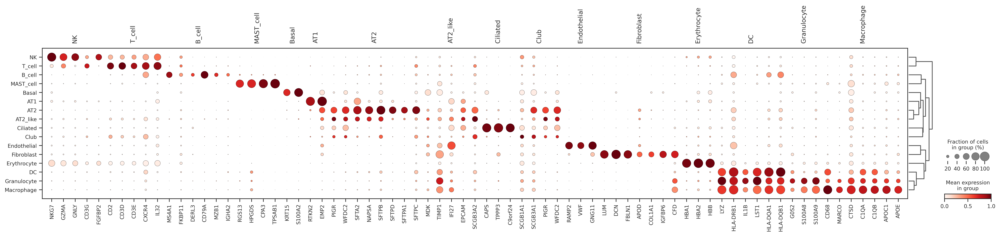

In [80]:
sc.tl.dendrogram(adata, groupby='annotation')
fig,ax=plt.subplots(figsize=(26,5))
sc.pl.dotplot(adata, gene_dict, groupby='annotation', dendrogram=True,standard_scale='group',show=False,ax=ax)
plt.savefig("results/sc_marker_genes.pdf", dpi=400, bbox_inches='tight',format='pdf')

[<AxesSubplot:title={'center':'NKG7'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'GZMA'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'GNLY'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'FGFBP2'}, xlabel='UMAP1', ylabel='UMAP2'>]

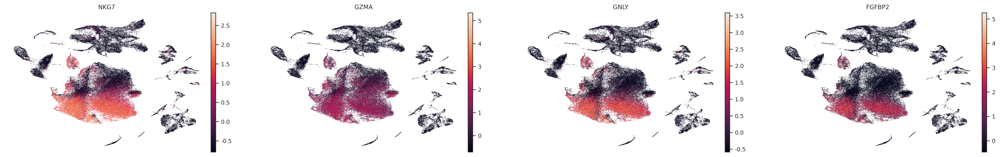

In [85]:
sc.pl.umap(adata, color=['NKG7','GZMA','GNLY','FGFBP2'],frameon = False, show=False)
# ax.set_title(None)